pulsepp.ipynb ->

# Notes

~~Would it be nice to do that (enhance faces людей на фотографиях) in real-time?  Seems that it would be a decent app~~

## Tryin' my own encoder with 5 different pictures x 5 different learning rates

Loss curve seemingly does not differ between 32x32 and 128x128 CelebA.  Unfortunately it does not recognize the difference between the loss minimized because of face made more similar and the one minimized because the quality made worse...

The lower the learning rate, the smoother the loss curve.  Not exactly surprising

## Other

Стоит попробовать:
* ~~просто подменить лица гранями~~ мимо
* L1 от граней
* abs(L1 от граней) таким образом, чтоб "не отнимать"

\+ можно было бы "подчеркивать" face landmarks, но есть подозрение, что проблему с глазами это только усугубило бы

# To Do

* ~~скрутить encoder и нейронку для оценки качества воедино, прикрутить к серверу~~
* ~~(если "тренировать дольше для фото лучшего качества" таки promisin'), собрать и натренировать нейронку для оценки качества~~
* ~~проверить, promisin' ли тренировать дольше для фото лучшего качества, проверить на фото разного качества~~
  -> проблема "фото лучшего качества" теперь out of scope - letsenhance.io справляется
* ~~проверить, promisin' ли тренировать, пока Laplacian(?)(tensor).var().log() не пересек threshold~~
  -> да, не бесполезно
* ~~дампить файлы, генерить видео~~
* ~~penalize blurriness как-то лучше, чем с помощью -Laplacian(?)(tensor).var().log()~~  
  -> не шибко обнадеживающе: всё равно размыто, но как будто зашумлено, что ли
* ~~~повторить результат stylegan-encoder~~~  
  -> не то чтоб прямо "повторил", но получилось очень прилично
* ~~завести encoder на PyTorch (хорошо, если не GPU-only)~~
* ~~stylegan-encoder стремится повторить размытость -> попробовать "подкастомайзить" encoder~~
* ~~попробовать процедуру из [Face editing with Generative Adversarial Networks](https://www.youtube.com/watch?v=dCKbRCUyop8)~~
* ~~попробовать pix2pix на CelebA (grayscale?)~~  
  -> does not seem to be promising

# Libs

In [1]:
import argparse
import sys
import os
import pathlib
from pathlib import Path
import functools
import contextlib
import logging
import io
import ast

In [2]:
import collections
import numbers
import operator
import bisect
import threading as th
import collections
import time
import ssl
import websocket
import json
import shutil
import warnings
import re
import argparse
import sys
import itertools
import random
import gc
import copy
import math

In [54]:
logging.getLogger().setLevel("DEBUG")

In [3]:
import numpy as np
import scipy as sp
import pandas as pd

pd.set_option("max_rows", 128)
pd.set_option("max_columns", None)
pd.set_option("max_colwidth", 1024)

import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d.axes3d import Axes3D
import seaborn as sns
# import plotly
# import plotly.offline as po
# import plotly.graph_objs as pg
# import plotly.figure_factory as pf

In [4]:
if True:
    %matplotlib inline
#     %matplotlib widget
    plt.rcParams["figure.figsize"] = (8.0, 6.0)
    plt.rcParams["animation.html"] = "html5"
else:
    # Appears not to work
    %matplotlib notebook
sns.set()
sns.set_style("whitegrid")
# po.init_notebook_mode(connected=True)

# import cufflinks as cf
# cf.set_config_file(offline=True)

import sklearn
# from sklearn import datasets
from sklearn import (
    preprocessing,
    pipeline,
    metrics,
    dummy
)

In [5]:
from sklearn import (
    linear_model,
    ensemble,
    neural_network,
    tree,
    svm
)
from sklearn import (
    neighbors,
    manifold,
    decomposition,
    cluster
)
from sklearn import (
    model_selection,
    utils
)

# import eli5
# import lime
# import lime.lime_tabular
# import shap

In [6]:
import torch
torch.set_default_tensor_type('torch.FloatTensor')

# import xgboost as xgb
# import gensim

import PIL
import cv2
import torchvision

In [7]:
from torch import (
    nn,
    optim,
    utils,
)
from PIL import (
    Image,
    ImageEnhance,
    ImageFilter,
)
from torchvision import (
    datasets,
    transforms,
    models,
)

## 4 export

In [8]:
# export encoder.py
import argparse
import sys
import os
import pathlib
from pathlib import Path
import functools
from functools import partial
import contextlib
import logging
import io
import itertools

import numpy as np
import torch
from torch import (
    nn,
    optim,
)
from PIL import Image
from torchvision import models
from torchvision.transforms import (
    ToPILImage,
    Compose,
    ToTensor,
    Normalize,
)

from style_gan import g_all as g

from models.image_to_latent import ImageToLatent as Initializer

import dlib
import bz2
from imutils import face_utils
import cv2

from kornia.filters.laplacian import (
    laplacian,
    get_laplacian_kernel2d,
    Laplacian,
)

# from kornia.filters import spatial_gradient

from pytorch_ssim import ssim

from lpips_pytorch import LPIPS, lpips

# from kornia.filters.blur import BoxBlur

Using TensorFlow backend.


In [9]:
# export ../scripts/make_video.py
import argparse
import sys
import os
from pathlib import Path
from functools import partial
import logging
import io
import ast

import numpy as np
import torch
from torchvision.transforms import (
    ToPILImage,
    Compose,
)

from style_gan import g_all as g

import cv2

# Constants

In [10]:
# export encoder.py
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)

# Utils

In [11]:
# export encoder.py
def unpack_bz2(src_path):
    data = bz2.BZ2File(src_path).read()
    dst_path = src_path[:-4]
    with open(dst_path, 'wb') as fp:
        fp.write(data)
    return dst_path

In [12]:
# export encoder.py
def _load_model(model, filename, map_location=None):
    model.load_state_dict(torch.load(filename, map_location=map_location))
    return model

Fuck it is unfortunate...

In [13]:
# export ../scripts/make_video.py
def _load_model(model, filename, map_location=None):
    model.load_state_dict(torch.load(filename, map_location=map_location))
    return model

In [14]:
def _scale(image, factor=2):
    return transforms.Resize(
        (np.array(image.size[::-1]) * factor).astype(int)
    )(image)

In [15]:
# export encoder.py
def _minmax_scale(tensor, range_=(0, 1)):
    min_, max_ = sorted(range_)
    return (
        (tensor - tensor.min()) / (tensor.max() - tensor.min()) * (max_ - min_)
        + min_
    )

Fuck it is unfortunate...

In [16]:
# export ../scripts/make_video.py
def _minmax_scale(tensor, range_=(0, 1)):
    min_, max_ = sorted(range_)
    return (
        (tensor - tensor.min()) / (tensor.max() - tensor.min()) * (max_ - min_)
        + min_
    )

In [17]:
# def _denormalize(tensor):
#     # TODO: make it real
#     return (tensor.clamp(-1, 1) + 1) / 2

In [18]:
def _to_nchw(hwc):
    return hwc.transpose(2, 0, 1)[np.newaxis, ...]

In [19]:
# Superceded by from torchvision.transforms import ToPILImage
# def _to_image(one_image_batch):
#     return transforms.ToPILImage()(one_image_batch.squeeze(0))
# _to_image = transforms.ToPILImage()

In [20]:
# export encoder.py
# def _to_batch(tensor):
#     return tensor.unsqueeze(0)
# def _from_batch(one_item_batch):
#     # One-itemness NOT enforced
#     return one_item_batch.squeeze(0)
_to_batch = functools.partial(torch.unsqueeze, dim=0)
_from_batch = functools.partial(torch.squeeze, dim=0)

In [21]:
def _make_showable(batch):
    return np.transpose(
        torchvision.utils.make_grid(batch, normalize=True),
        (1, 2, 0)
    )

In [22]:
def _hstack(one, other):
    res = Image.new('RGB', (one.width + other.width, one.height))
    res.paste(one, (0, 0))
    res.paste(other, (one.width, 0))
    return res

In [23]:
def _take_n_random_files(sourcedir, n, random_state=None):
    return (
        pd.Series(pathlib.Path(sourcedir).iterdir())
            .sample(n, random_state=random_state)
            .tolist()
    )

In [24]:
def _take_n_random_images(sourcedir, n, random_state=None):
    return (
        pd.Series(pathlib.Path(sourcedir).iterdir())
            .sample(n, random_state=random_state)
            .apply(Image.open)
            .tolist()
    )

In [25]:
def _make_square(img):
    return transforms.CenterCrop(min(img.size))(img)

In [26]:
def _save_to_remote(img, dest):
    host, file = re.match(
        "^sftp:\/{1,2}([A-Za-z0-9._-]+)(\/.*)$"
        , str(dest)
    ).groups()
    file = pathlib.Path(file)
    img.save(file.name)
    os.system(f"scp {file.name} {host}:{file.parent}")
    os.unlink(file.name)

In [27]:
# export encoder.py
@contextlib.contextmanager
def _clean_step_of(optimizer):
    optimizer.zero_grad()
    yield
    optimizer.step()

In [28]:
def _to_PIL_box(cv_box):
    x, y, dx, dy = cv_box
    return (x, y, x + dx, y + dy)

# Tryin' stylegan-encoder

from pulsepp.ipynb

In [29]:
# files = sorted(pathlib.Path("/home/ihor/Data/celeba-dataset-trunc-trunc/img_align_celeba/img_align_celeba/").iterdir())
# chosen = [
#     file for file in files
#     if (
#         "002639" in file.name
#         or "002464" in file.name
#         or "016942" in file.name
#     )
# ]

In [ ]:
# !mkdir raw_images

In [ ]:
# # file = next(iter(chosen))
# for file in chosen:
#     image = Compose([
#         Image.open,
# #         functools.partial(_scale, factor=0.5),
# #         functools.partial(_scale, factor=2)
#     ])(file)
#     image.save(
# #     print(
#         pathlib.Path(os.environ["HOME"]) / "Downloads" / "raw_images" / f"{file.stem}_noblur{file.suffix}")

In [ ]:
# mv raw_images/ /home/ihor/Downloads/raw_images

Actually works, but "fast" упускает важные детали, а "slow" - каким-то образом повторяет размытость

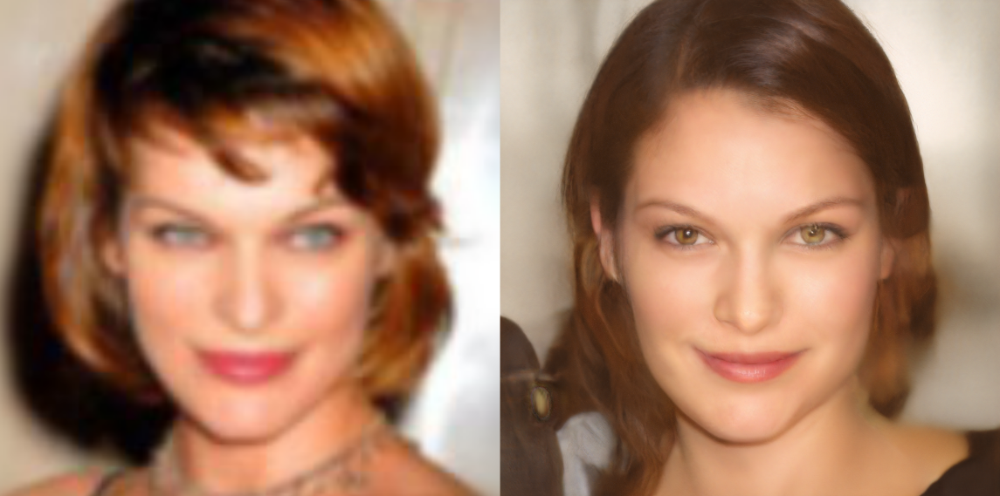

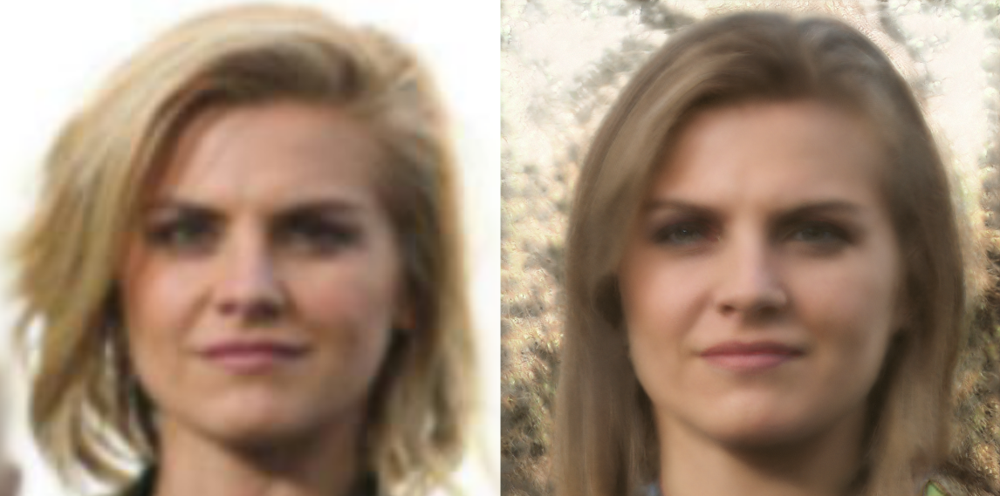

А что с нашим фото?

In [ ]:
# Image.open("../data/cropped.jpg").save("/home/ihor/Downloads/raw_images/cropped.png")

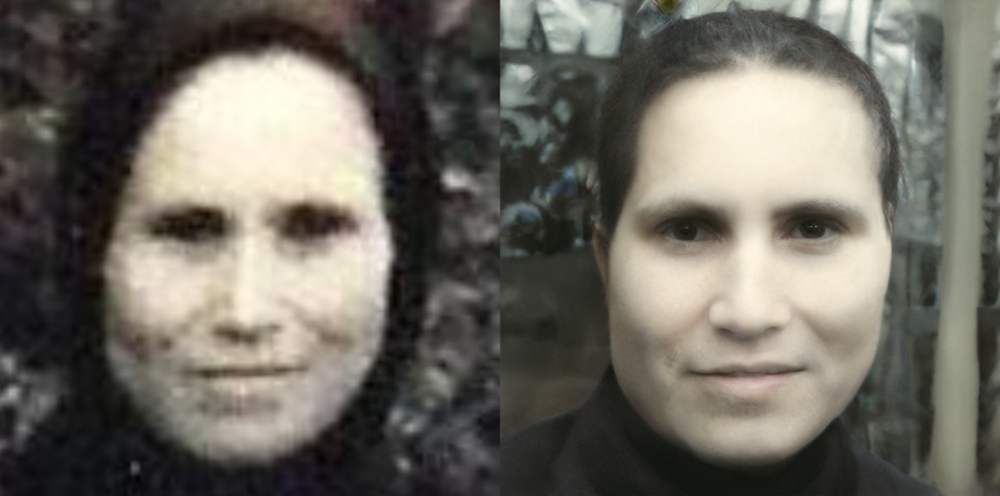

In [ ]:
def _to_PIL_box(cv_box):
    x, y, dx, dy = cv_box
    return x, y, x + dx, y + dy

In [ ]:
# pic = Image.open("../data/photo5332588235043483079.jpg")
# pic.crop(_to_PIL_box((380, 100, 150, 180))).save("/home/ihor/Downloads/raw_images/cropped2.png")

# Makin' pytorch_stylegan_encoder great too

In [ ]:
w = torch.from_numpy(np.load("/home/ihor/Software/pytorch_stylegan_encoder/dlatents.npy"))
w

In [ ]:
# path = "/home/ihor/Software/pytorch_stylegan_encoder/"
# if path not in sys.path:
#     sys.path.insert(0, path)

In [ ]:
# from InterFaceGAN.models.stylegan_generator import StyleGANGenerator
# g = StyleGANGenerator("stylegan_ffhq").model

In [ ]:
from OtherStyleGAN import g_all as g
g = _load_model(g, "/home/ihor/Pretrained/karras2019stylegan-ffhq-1024x1024.for_g_all.pt")
g.eval();

In [ ]:
w.shape

In [ ]:
generated = Compose([
    g.g_synthesis,
    _minmax_scale,
#     lambda tensor: (tensor - (-1)) * torch.tensor(255).float() / (1 - (-1)),
#     lambda tensor: torch.clamp(tensor + 0.5, min=0, max=255),
#     lambda tensor: tensor.detach().numpy(),
    _from_batch,
#     lambda array: array[0],
    ToPILImage()
#     lambda array: np.transpose(array, (1,2,0)).astype(np.uint8),
#     Image.fromarray
])(
    w
#     out
)

In [ ]:
_scale(generated, 0.375)

In [ ]:
tensor = torch.tensor(1., requires_grad=True)

In [ ]:
optimizer = optim.LBFGS([tensor], lr=0.1, max_iter=7)

In [ ]:
tensor, optimizer.state_dict()

In [ ]:
optimizer.zero_grad()
tensor.backward()
optimizer.step(lambda: tensor)
tensor, optimizer.state_dict()

In [ ]:
optimizer.zero_grad()
tensor.backward()
optimizer.step(lambda: tensor)
tensor, optimizer.state_dict()

In [ ]:
tensor = torch.tensor(1., requires_grad=True)

In [ ]:
optimizer = optim.Adam([tensor], lr=0.1)

In [ ]:
scheduler = optim.lr_scheduler.ExponentialLR(
    optimizer, 0.95
)

In [ ]:
tensor, optimizer.state_dict(), scheduler.get_last_lr()

In [ ]:
optimizer.zero_grad()
tensor.backward()
optimizer.step()
scheduler.step()
tensor, optimizer.state_dict(), scheduler.get_last_lr()

In [ ]:
optimizer.zero_grad()
tensor.backward()
optimizer.step()
scheduler.step()
tensor, optimizer.state_dict(), scheduler.get_last_lr()

In [ ]:
optimizer.zero_grad()
tensor.backward()
optimizer.step()
scheduler.step()
tensor, optimizer.state_dict(), scheduler.get_last_lr()

In [ ]:
optimizer.zero_grad()
tensor.backward()
optimizer.step()
scheduler.step()
tensor, optimizer.state_dict(), scheduler.get_last_lr()

# Makin' stylegan-encoder of my own

## Задача

Given:
* (for now aligned) image of interest $i_t$

Sought:
* corresponding array $w_t$ s.t. $generator.synthesis: w_t -> i_t$

In [40]:
# target_image = Image.open("/home/ihor/Downloads/aligned_images/002464_01.png")
target_image = Image.open("/home/ihor/Dropbox/Documents/Projects/GANcestors/Enhancer/data/aligned/our-woman.png")
_scale(target_image, 0.375);

In [31]:
g = (
    _load_model(g, "/home/ihor/Pretrained/karras2019stylegan-ffhq-1024x1024.for_g_all.pt")
        .eval()
        .requires_grad_(False)
)

In [32]:
optimized = g.g_mapping(torch.randn(1, 512))

In [33]:
Compose([
#     g.g_synthesis,
#     _minmax_scale,
#     _from_batch,
#     ToPILImage(),
    lambda _: target_image,
    partial(_scale, factor=0.375)
])(optimized);

In [34]:
# class _Encoder:
    
#     def __init__(self, *args, **kwargs):
#         pass
    
#     def encode(image):
#         return optimized

## Initializer

$f: i_t -> w^{(0)}_{opt}$

In [35]:
initializer = (
    _load_model(
        Initializer(),
        "/home/ihor/Software/pytorch_stylegan_encoder/image_to_latent.pt",
        map_location="cpu"
    )
        .eval()
        .requires_grad_(False)
)

In [ ]:
# guess = Compose([
#     # load_images
#     np.asarray,
#     partial(np.transpose, axes=(2, 0, 1)),
#     lambda array: np.array([array]),
#     # 
#     torch.from_numpy,
#     # VGGProcessing.forward
#     lambda tensor: tensor / torch.tensor(255).float(),
#     partial(torch.nn.functional.adaptive_avg_pool2d, output_size=256),
#     lambda tensor: (
#         (tensor - torch.tensor(MEAN).view(-1, 1, 1))
#         / torch.tensor(STD).view(-1, 1, 1)
#     ),
#     initializer
# ])(target_image)

In [59]:
guess = Compose([
    ToTensor(),
    Normalize(MEAN, STD),
    _to_batch,
    nn.AdaptiveAvgPool2d((256, 256)),
    initializer
])(target_image)

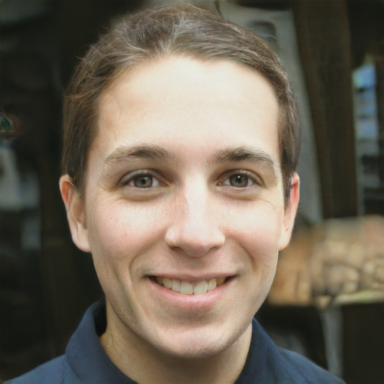

In [142]:
with torch.no_grad():
    generated_image = Compose([
        # target_image -> guess
        ToTensor(),
        Normalize(MEAN, STD),
#         _minmax_scale,
#         ToPILImage()
        _to_batch,
        nn.AdaptiveAvgPool2d((256, 256)),
        initializer,
        lambda tensor: tensor.std() * torch.randn_like(tensor) + tensor,
        # guess -> generated_image
        g.g_synthesis,
        _from_batch,
        _minmax_scale,
        ToPILImage(),
        partial(_scale, factor=0.375)
    ])(target_image)
generated_image

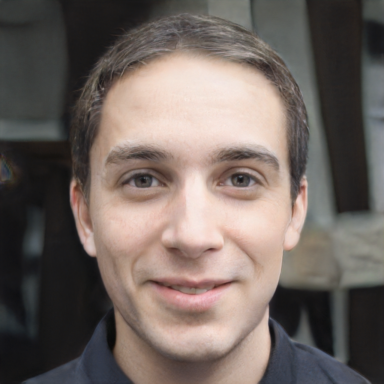

In [141]:
with torch.no_grad():
    generated_image = Compose([
        # target_image -> guess
        ToTensor(),
        Normalize(MEAN, STD),
#         _minmax_scale,
#         ToPILImage()
        _to_batch,
        nn.AdaptiveAvgPool2d((256, 256)),
        initializer,
        lambda tensor: tensor.std() * torch.randn_like(tensor) + tensor,
        # guess -> generated_image
        g.g_synthesis,
        _from_batch,
        _minmax_scale,
        ToPILImage(),
        partial(_scale, factor=0.375)
    ])(target_image)
generated_image

## Loss

$? : (i^{(i)}_{opt}, i_t) -> loss$

In [ ]:
# class _LossCalculator:
    
#     def __init__(self, *args, **kwargs):
#         pass

#     def calculate_loss(generated, target):
#         return loss

In [38]:
generated_image, target_image;

In [41]:
# Caution: these back-and-forth do change things, better happen once
Compose(
    12 * [
        ToTensor(),
        Normalize(MEAN, STD),
        _to_batch,
        _from_batch,
        _minmax_scale,
#         lambda tensor: (tensor.clamp(-1, 1) + 1) / 2,
        ToPILImage(),
    ] + [partial(_scale, factor=0.375)]
)(generated_image)

In [42]:
# export encoder.py
_image_to_batch = Compose([
    ToTensor(),
    Normalize(MEAN, STD),
    _to_batch,
])

In [49]:
generated, target = (
    _image_to_batch(image)
    for image in (generated_image, target_image)
)

In [ ]:
# generated, target

In [50]:
extractor = (
    models.vgg16(pretrained=True).features[:12]
        .eval()
        .requires_grad_(False)
)

In [ ]:
# extractor(target).shape

In [ ]:
# def _to_features(image_tensor):
#     return Compose([
#         nn.AdaptiveAvgPool2d((256, 256)),
#         extractor,
#     ])(image_tensor)
# _to_features(target)[:2, :2, :2, :2]

In [48]:
Laplacian(3)(target).var().log()

In [29]:
# export encoder.py
class _LossCalculator:

    def __init__(self, device="cpu"):
        extractor = (
            models.vgg16(pretrained=True)
                .features
                [:12]
                .eval()
                .requires_grad_(False)
                .to(device)
        )
        self._to_features = Compose([
            nn.AdaptiveAvgPool2d((256, 256)),
            extractor,
        ])
        # self._l2 = nn.MSELoss()
        self._mask_maker = _MaskMaker()
        self._mask = None
        # self._laplacian = (
        #     Laplacian(3)
        #         .to(device)
        # )
        # self._laplacians = (
        #     Laplacian(3)
        #         .to(device),
        #     Laplacian(5)
        #         .to(device),
        #     Laplacian(7)
        #         .to(device),
        #     Laplacian(9)
        #         .to(device),
        # )
        self._lpips = (
            LPIPS(
                # "vgg" # scary
                "alex"
            )
                .eval()
                .requires_grad_(False)
                .to(device)
        )
        # self._to_edges = lambda tensor: (
        #     (spatial_gradient(tensor) ** 2).sum(axis=2).sqrt()
        # )
        # self._blur = BoxBlur((48, 48))

    def calculate_loss(self, guess_and_generated, target):
        # Poor way to cache
        if self._mask is None:
            self._mask = self._mask_maker.process(target)
        guess, generated = guess_and_generated
        # target, generated = (self._to_edges(tensor) for tensor in (
        #     target, generated
        # ))
        # generated = self._blur(generated)
        return (
            # L1/L2/logcosh on features
            nn.MSELoss()
            # nn.L1Loss()
            # (lambda y_hat, y: torch.mean(torch.log(torch.cosh(y_hat - y))))
            (
                self._to_features(self._mask * generated),
                self._to_features(self._mask * target)
            )
            # + 5 * -torch.log(torch.var(self._laplacian(generated)))
            # + 0.05 * -torch.log(
            #     torch.var(self._laplacians[0](generated))
            #     + torch.var(self._laplacians[1](generated))
            #     + torch.var(self._laplacians[2](generated))
            #     + torch.var(self._laplacians[3](generated))
            # )
            # logcosh on pixels
            + 1.5 * (lambda y_hat, y: (
                torch.mean(torch.log(torch.cosh(y_hat - y)))
            ))
            (
                self._mask *
                generated,
                self._mask *
                target
            )
            # ssim
            + 200 * torch.mean(1 - ssim(
                self._mask *
                target,
                self._mask *
                generated
            ))
            # lpips
            + 100 * torch.mean(self._lpips(
                self._mask *
                target,
                self._mask *
                generated
            ))
            # L1 penalty on generator input
            + (
                0.5
                # 50
                # 500 # scary
            ) * torch.mean(torch.abs(guess - torch.mean(guess,
                axis=2, keepdim=True
            )))
        )

In [48]:
calc = _LossCalculator()

In [49]:
calc.calculate_loss((guess, g.g_synthesis(guess)), target)

tensor(64.6841)

In [ ]:
# calc.calculate_loss(generated, target)

In [ ]:
# # + face mask
# calc.calculate_loss(generated, target)

In [ ]:
# # + penalty for blurriness
# calc.calculate_loss(generated, target)

In [ ]:
# Interface change
calc.calculate_loss(guess, target)

In [ ]:
latent

In [ ]:
buf = io.BytesIO()
torch.save(latent, buf)

In [ ]:
torch.load(io.BytesIO(ast.literal_eval(str(buf.getvalue()))))

Ок, что ещё?

### Face mask

In [ ]:
# detector = dlib.get_frontal_face_detector()
# predictor = dlib.shape_predictor(unpack_bz2(keras.utils.get_file(
#     'shape_predictor_68_face_landmarks.dat.bz2',
#     "http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2",
#     cache_subdir='temp'
# )))

In [ ]:
# Compose([
#     _from_batch,
#     _minmax_scale,
#     partial(np.transpose, axes=(1, 2, 0)),
#     plt.imshow
# ])(target)

In [ ]:
# detector_input = Compose([
#     _from_batch,
#     _minmax_scale,
#     partial(np.transpose, axes=(1, 2, 0)),
#     lambda tensor: tensor.numpy(),
#     lambda array: (array * 255).astype("uint8")
# ])(target)

In [ ]:
# detector_input.min(), detector_input.max()

In [ ]:
# rectangles = detector(detector_input, 1)
# rectangle = rectangles[0]

In [ ]:
# target_image.crop(
#     (rectangle.left(), rectangle.top(), rectangle.right(), rectangle.bottom())
# )

In [ ]:
# Compose([
#     partial(predictor, box=rectangle),
#     face_utils.shape_to_np,
#     cv2.convexHull
# ])(detector_input);

In [ ]:
# mask = cv2.fillConvexPoly(
#     np.zeros(detector_input.shape[:2], np.uint8),
#     Compose([
#         partial(predictor, box=rectangle),
#         face_utils.shape_to_np,
#         cv2.convexHull
#     ])(detector_input),
#     1
# )

In [ ]:
# Compose([
#     lambda tensor: torch.from_numpy(mask) * tensor,
#     _minmax_scale,
#     _from_batch,
#     ToPILImage()
# ])(target)

In [ ]:
# array = Compose([
#     _from_batch,
#     partial(np.transpose, axes=(1, 2, 0)),
#     lambda tensor: tensor.numpy(),
#     partial(_minmax_scale, range_=(0, 255)),
#     lambda array: array.astype(np.uint8)
# ])(target)

In [30]:
# export encoder.py
class _MaskMaker:

    def __init__(self):
        self._detector = dlib.get_frontal_face_detector()
        # Takes forever to import keras, pushed to runtime
        import keras
        self._predictor = dlib.shape_predictor(unpack_bz2(keras.utils.get_file(
            "shape_predictor_68_face_landmarks.dat.bz2",
            "http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2",
            cache_subdir="temp"
        )))

    def process(self, target):
        assert len(target.shape) == 4, "input should be of batch-like shape"
        assert target.size(0) == 1, "only one-image batches are supported"
        as_array = Compose([
            _from_batch,
            lambda tensor: tensor.cpu().numpy(),
            partial(np.transpose, axes=(1, 2, 0)),
            partial(_minmax_scale, range_=(0, 255)),
            lambda array: array.astype(np.uint8)
        ])(target)
        rectangles = self._detector(as_array, upsample_num_times=0)
        assert rectangles, "no face detected"
        assert len(rectangles) == 1, "multiple faces detected, expect one"
        rectangle = next(rectangle for rectangle in rectangles)
        return Compose([
            torch.from_numpy,
            lambda tensor: tensor.type(target.type()),
            # Add channel dimension, for shape consistency with input
            lambda tensor: tensor.unsqueeze(0),
            _to_batch,
        ])(
            cv2.fillConvexPoly(
                np.zeros(as_array.shape[:-1], np.uint8),
                Compose([
                    partial(self._predictor, box=rectangle),
                    face_utils.shape_to_np,
                    cv2.convexHull
                ])(as_array),
                1
            )
        )

In [ ]:
# target = Compose([
#     Image.open,
#     _image_to_batch
# ])("/home/ihor/Downloads/aligned_images/002464_01.png")

In [81]:
mask_maker = _MaskMaker()

In [158]:
mask = mask_maker.process(target)
mask;

In [ ]:
mask = Compose([
    _to_batch,
    ToPILImage(),
    lambda image: image.filter(ImageFilter.GaussianBlur(8)),
    ToTensor(),
    _from_batch
])(mask)

In [ ]:
Compose([
    _from_batch,
    _minmax_scale,
    ToPILImage(),
    partial(_scale, factor=0.375)
])(mask * target)

### Penalize blur?  How?

In [ ]:
import cv2

In [ ]:
image = cv2.imread("../002464_01.png") / 255
plt.imshow(image);

In [ ]:
gray = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY) / 255
plt.imshow(gray, cmap="gray");

In [ ]:
image.shape

In [ ]:
transformed = Compose([
    _from_batch,
#     partial(_minmax_scale, range_=(0.05, 1)),
    _minmax_scale,
    lambda tensor: tensor.cpu().numpy(),
    partial(np.transpose, axes=(1, 2, 0))
])(target)

In [ ]:
cv2.Laplacian(image * 255, 6).var()

In [ ]:
laplacian(target, 3).var()

In [ ]:
# Image.fromarray((transformed * 255).astype(np.uint8))

In [ ]:
# cv2.Laplacian(
# #     (transformed * 255),
# #     cv2.cvtColor(transformed, cv2.COLOR_RGB2BGR),
# #     Image.fromarray((transformed * 255).astype(np.uint8)),
#     6
# ).var()

In [ ]:
# list(Path("/home/ihor/Data/celeba-dataset-trunc-trunc/img_align_celeba/img_align_celeba/").iterdir())

In [ ]:
files = np.random.RandomState(0).choice(
    list(Path("/home/ihor/Data/celeba-dataset-trunc-trunc/img_align_celeba/img_align_celeba/").iterdir()),
    100
)
factors = 0.2 + (1 - 0.2) * np.random.RandomState(0).rand(100)

In [ ]:
def _blur(image, factor):
    return Compose([
        partial(_scale, factor=factor),
        partial(_scale, factor=1 / factor),
    ])(image)

In [ ]:
results = []

In [ ]:
file, factor = next(zip(files, factors))
for file, factor in zip(files, factors):
#     image = Image.open(file)
    blurred = _blur(image, factor)
    metric = Compose([
        ToTensor(),
        _to_batch,
        lambda tensor: laplacian(tensor, 3).var().item()
    ])(blurred)
    results.append((file.name, factor, metric))

In [ ]:
Compose([
    ToTensor(),
    _to_batch,
    lambda tensor: Laplacian(3)(tensor).var().item()
])(blurred)

In [ ]:
(
    pd.DataFrame(
        results, columns=["name", "factor", "metric"]
    )
        .pipe(lambda frame: plt.plot(
            frame.factor,
#             1 / frame.metric,
#             -frame.metric,
            -np.log(frame.metric),
            linestyle="none", marker="o"
        ))
#         .plot("factor", "metric", linestyle="none", marker="o")
)

### "~~Яйца~~ функции ошибки в кулак" (с)

### В топку функции ошибки, пробуем контуры лица 

In [223]:
# class _LossCalculator:
    
#     def __init__(self, device="cpu"):
#         self._mask_maker = _MaskMaker()
#         self._mask = None
    
#     def calculate_loss(self, guess_and_generated, target):
#         # Poor way to cache.  TODO: implement lru_cache for instance
#         # methods
#         if self._mask is None:
#             self._mask = self._mask_maker.process(target)
#         guess, generated = guess_and_generated
#         return torch.tensor(1)

In [94]:
calc = _LossCalculator()

In [95]:
calc.calculate_loss((1, generated), target)

tensor(1)

In [126]:
from kornia.filters import (
    laplacian,
    sobel,
    spatial_gradient,
)
from kornia.color import rgb_to_grayscale

In [46]:
_batch_to_image = Compose([
    _from_batch,
    _minmax_scale,
    ToPILImage()
])
_batch_to_image(target);

NameError: name 'target' is not defined

In [238]:
def _to_edges(image):
    return Compose([
#         rgb_to_grayscale,
#         partial(laplacian, kernel_size=3),
#         sobel,
        lambda tensor: (spatial_gradient(tensor) ** 2).sum(axis=2).sqrt(),
#         lambda image: image * mask,
#         # Cut off "noise"
#         lambda image: image.where(
#             image > image.max() * 0.1, torch.zeros_like(image)
#         ),
    ])(image)

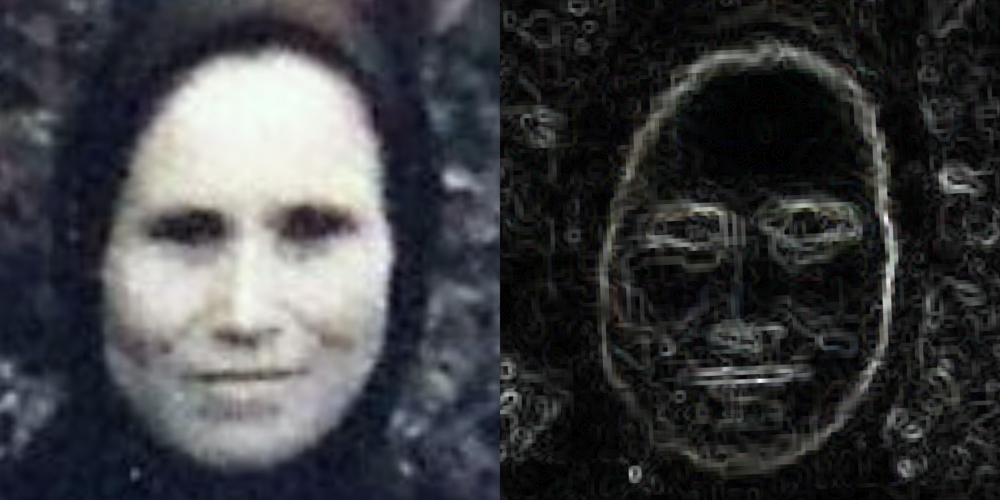

In [243]:
_hstack(
    _batch_to_image(target),
    _batch_to_image(_to_edges(target))
)

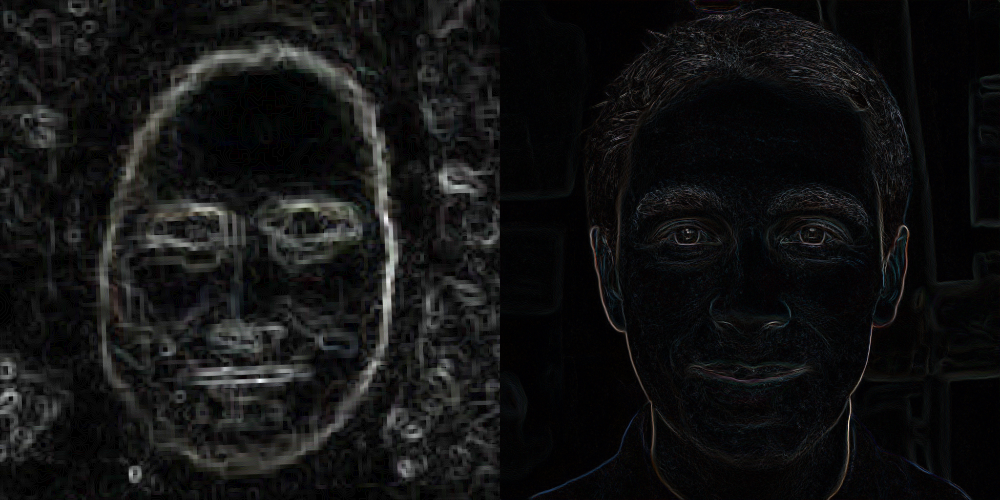

In [239]:
_hstack(
    _batch_to_image(_to_edges(target)),
    _batch_to_image(_to_edges(generated))
)

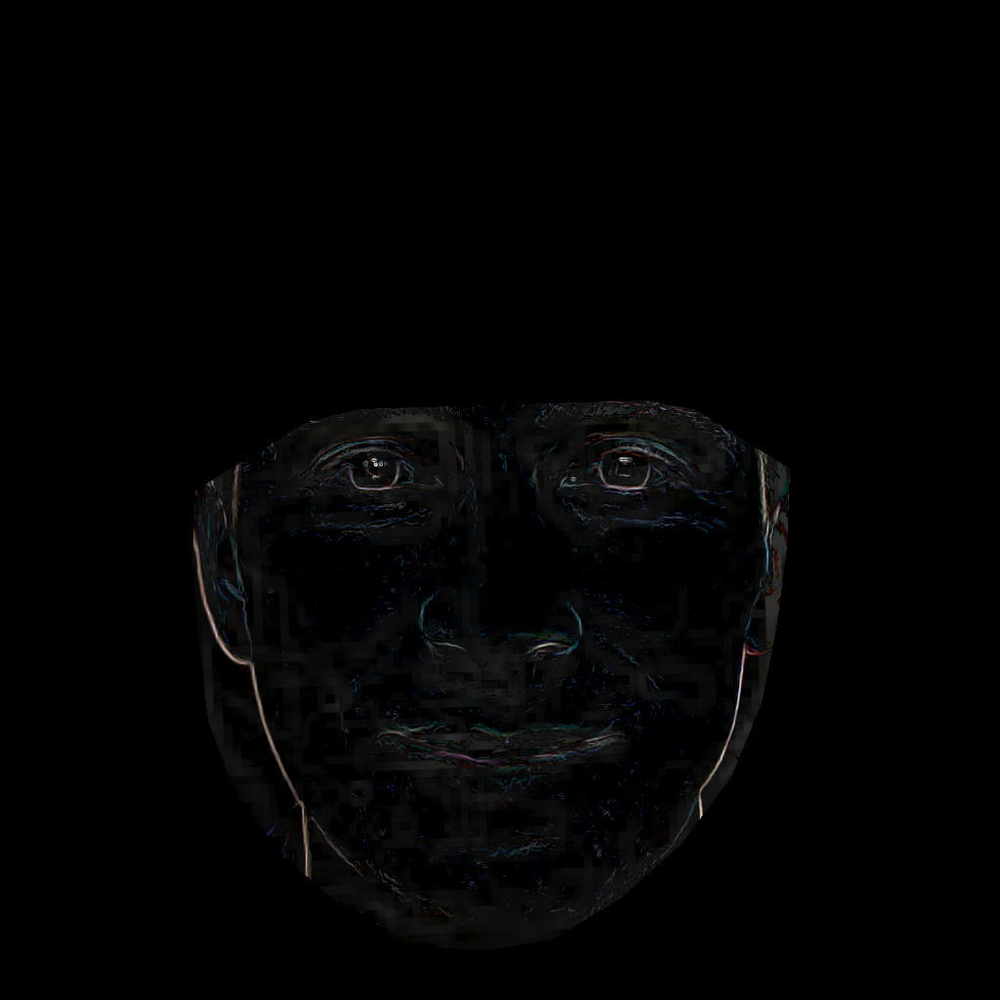

In [236]:
_batch_to_image(
    (-(_to_edges(target) - _to_edges(generated))).abs()
)

### В топку контуры лица, пробуем размывать искусственно

In [52]:
from kornia.filters.blur import box_blur

In [99]:
def _blur(tensor, factor):
    height, width = tensor.shape[-2:]
    assert height == width
    downscaled = int(np.round(factor * height))
    return Compose([
        nn.AdaptiveAvgPool2d((downscaled, downscaled)),
        nn.AdaptiveAvgPool2d((height, height)),
    ])(tensor)

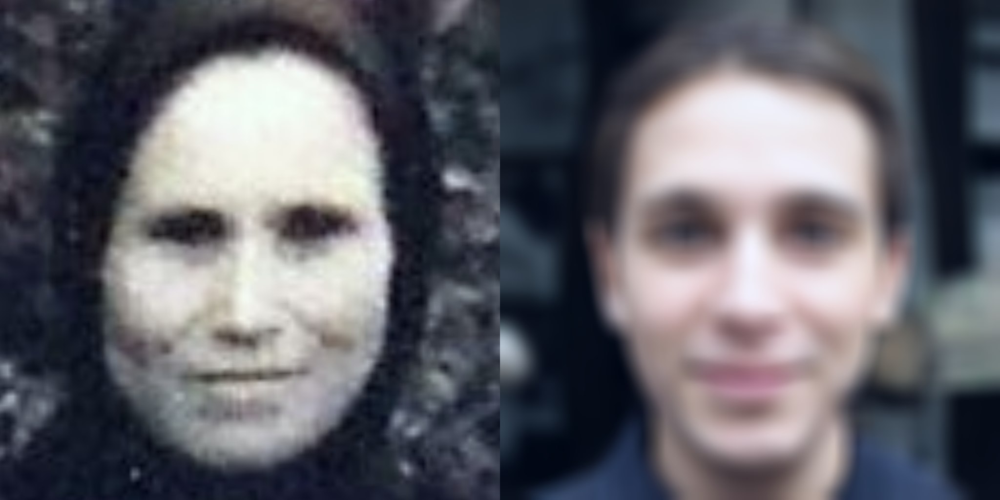

In [56]:
_hstack(
    _batch_to_image(target),
    Compose([
#         partial(_blur, factor=1 / 32),
#         partial(box_blur, kernel_size=(1024, 1024)), # takes TOO long
        partial(box_blur, kernel_size=(48, 48)),
        _batch_to_image
    ])(generated)
)

### Пробуем разные initial guesses

## Together

In [ ]:
initializer = (
    _load_model(
        Initializer(),
        "/home/ihor/Software/pytorch_stylegan_encoder/image_to_latent.pt",
        map_location="cpu"
    )
        .eval()
        .requires_grad_(False)
)

In [ ]:
target = _image_to_batch(target_image)

In [ ]:
guess = Compose([
    nn.AdaptiveAvgPool2d((256, 256)),
    initializer,
    lambda tensor: tensor.requires_grad_()
])(target)

In [ ]:
# g = (
#     _load_model(
#         g,
#         "/home/ihor/Pretrained/karras2019stylegan-ffhq-1024x1024.for_g_all.pt"
#     )
#         .eval()
#         .requires_grad_(False)
# )

In [ ]:
synthesis = (
    _load_model(
        g,
        "/home/ihor/Pretrained/karras2019stylegan-ffhq-1024x1024.for_g_all.pt"
    )
        .g_synthesis
        .eval()
        .requires_grad_(False)
)

In [ ]:
calc = _LossCalculator()

In [ ]:
optimizer = optim.SGD([guess], 1)

In [ ]:
with _clean_step_of(optimizer):
    generated = Compose([
        synthesis
    ])(guess)
    loss = calc.calculate_loss(generated, target)
    loss.backward()

## Really together

In [70]:
# export encoder.py
class _Encoder:

    def __init__(self, params):
        self._params = params
        self._device = torch.device("cuda" if params.use_gpu else "cpu")
        self._initializer = (
            _load_model(
                Initializer(),
                Path(os.environ["HOME"])
                / "Software/pytorch_stylegan_encoder/image_to_latent.pt",
                map_location=self._device
            )
                .eval()
                .requires_grad_(False)
                .to(self._device)
        )
        self._calc = _LossCalculator(self._device)
        # Monitoring
        self._logger = logging.getLogger(__name__)
        # Endmonitoring
        self._synthesis = (
            _load_model(
                g,
                Path(os.environ["HOME"])
                / "Pretrained/karras2019stylegan-ffhq-1024x1024.for_g_all.pt",
                map_location=self._device
            )
                .g_synthesis
                .eval()
                .requires_grad_(False)
                .to(self._device)
        )

    def encode(
        self, image, guess=None, continue_=lambda i: i < 1, test=True,
        return_byproducts=False
    ):
        target = _image_to_batch(image).to(self._device)
        if guess is None:
            guess = Compose([
                nn.AdaptiveAvgPool2d((256, 256)),
                self._initializer,
                # lambda tensor: tensor.std() * torch.randn_like(tensor) + tensor,
                lambda tensor: tensor.requires_grad_()
            ])(target)
        else:
            guess = Compose([
                torch.from_numpy,
                lambda tensor: tensor.to(self._device),
                lambda tensor: tensor.requires_grad_(),
            ])(guess)
        optimizer = optim.SGD([guess], self._params.lr)
        # # NOTE: blurry makes little sense if guess is not None
        # blurry = _Blurry()
        for i in itertools.count():
            if not continue_(i):
                break
            # Monitoring
            self._logger.info("step %i", i)
            # Endmonitoring
            with _clean_step_of(optimizer):
                generated = self._synthesis(guess)
                loss = self._calc.calculate_loss((guess, generated), target)
                loss.backward()
                # Monitoring
                with io.BytesIO() as buffer:
                    torch.save(guess, buffer)
                    self._logger.debug("guess - %s", buffer.getvalue())
                self._logger.info("loss - %.4f", loss.item())
                # self._logger.info(
                #     "relative blur - %f", blurry.estimate(generated)
                # )
                # Endmonitoring
            if test:
                break
        if return_byproducts:
            return guess, tuple(
                Compose([
                    _from_batch,
                    _minmax_scale,
                    ToPILImage(),
                ])(tensor) for tensor in (generated, self._calc._mask)
            )
        return guess

In [ ]:
# export encoder.py
class _Blurry:

    def __init__(self):
        self._initial = None
        self._laplacian = Laplacian(3)

    def estimate(self, image):
        # Expects tensor of size 1
        if self._initial is None:
            self._initial = self._compute_variance_of_laplacian(image)
            return 1.0
        return self._compute_variance_of_laplacian(image) / self._initial

    def _compute_variance_of_laplacian(self, image):
        return self._laplacian(image).var().item()

In [ ]:
b = _Blurry()

In [ ]:
b.estimate(generated)

1.0

In [ ]:
b.estimate(target)

0.022325921742985484

In [ ]:
# np.save("", latent.detach().numpy())

In [75]:
# export encoder.py
class _Parser(argparse.ArgumentParser):

    def specify_args(self):
        # This is madness!
        # return argparse.Namespace(
        args = argparse.Namespace(
            target_image="002464_01.png",
            guess=None,
            iterations=32,
            lr=0.0002,
            test=1,
            use_gpu=0,
            logging_level="INFO",
        )
        for key, value in args.__dict__.items():
            self.add_argument(
                f"--{key}", type=type(value) if value is not None else str,
                default=value, help=f"defaults to {value}"
            )
        return self

In [76]:
# export encoder.py
def _define_inputs():
    parser_or_namespace = _Parser().specify_args()
    try:
        return parser_or_namespace.parse_args()
    except AttributeError:
        return parser_or_namespace

In [98]:
inputs = argparse.Namespace(
    target_image="002464_01.png",
    guess=None,
    iterations=32,
    lr=0.0002,
    test=1,
    use_gpu=0,
    logging_level="INFO",
)
inputs

Namespace(guess=None, iterations=32, logging_level='INFO', lr=0.0002, target_image='002464_01.png', test=1, use_gpu=0)

In [99]:
encoder = _Encoder(argparse.Namespace(
    lr=0.0002,
    use_gpu=0,
    logging_level="INFO",
))

In [81]:
latent = encoder.encode(
    target_image, continue_=lambda i: i < inputs.iterations, test=inputs.test
)

INFO - step 0


## Really-really together

In [ ]:
# export encoder.py
def main():
    inputs = _define_inputs()
    # Monitoring
    logging.basicConfig(
        level=inputs.logging_level, format="%(levelname)s - %(message)s"
    )
    # Endmonitoring
    latent = _Encoder(argparse.Namespace(**{
        k: v for k, v in inputs.__dict__.items()
        if k not in {
            "target_image", "guess", "iterations", "test", "logging_level"
        }
    })).encode(
        Image.open(inputs.target_image),
        np.load(inputs.guess) if inputs.guess is not None else None,
        lambda i: i < inputs.iterations,
        inputs.test
    )
    np.save(
        "%s.npy" % (
            lambda path: path.parent / path.stem
        )(Path(inputs.target_image)),
        latent.detach().cpu().numpy()
    )

## Tryin' result

In [102]:
target_image = Image.open(
#     "../016942_01.png"
#     "../002464_01.png"
#     "../002464_noblur_01.png"
    "../data/our-woman.png"
)
_scale(target_image, 0.375)

In [101]:
target = _image_to_batch(target_image)

In [ ]:
# 0.1 * "blur loss", iterations 400, lr 1
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# 0.01 * "blur loss", iterations 400, lr 1
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# 0.05 * "blur loss", iterations 400, lr 1
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# 0.05 * "blur loss", iterations 400, lr 1
# "blur loss" includes multiple laplacians
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L1 (or smth close), iterations 400, lr 0.1
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L1 without 512 (or smth close), iterations 400, lr 0.1
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# -> then removed L1 (almost, 0.01), 100 iterations
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# -> then removed L1 (almost, 0.01), 400 iterations
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# -> then removed L1 (almost, 0.01), 800 iterations
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
#         "../016942_01.npy"
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2 + 0.5 L1 on w + log(cosh(generated - target)) with mask + ssim with mask + lpips with mask
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(mask * generated + (1 - mask) * target),    
))

In [ ]:
# L1
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# logcosh
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2 + 0.5 L1 on w
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2 + 0.5 L1 on w + log(cosh(generated - target))
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2 + 0.5 L1 on w + log(cosh(generated - target)) + ssim
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2 + 0.5 L1 on w + log(cosh(generated - target)) + ssim with mask
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2 + 0.5 L1 on w + log(cosh(generated - target)) + ssim with mask + lpips
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(generated),
))

In [ ]:
# L2 + 0.5 L1 on w + log(cosh(generated - target)) + ssim with mask + lpips with mask
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(mask * generated + (1 - mask) * target),    
))

In [ ]:
# L2 + 0.5 L1 on w + log(cosh(generated - target)) with mask + ssim with mask + lpips with mask
with torch.no_grad():
    generated = Compose([
        np.load,
        torch.from_numpy,
        g.g_synthesis,
    ])(
        "../002464_noblur_01.npy"
    )
functools.reduce(_hstack, (
    target_image,
    Compose([
        _from_batch,
        _minmax_scale,
        ToPILImage()
    ])(mask * generated + (1 - mask) * target),    
))

## Makin' video

In [ ]:
filename = "../log.2020-07-20T13:55:24+00:00"

In [ ]:
# export ../scripts/make_video.py
_to_tensor = Compose([
    lambda line: line.replace("DEBUG - guess - ", ""),
    ast.literal_eval,
    io.BytesIO,
    partial(torch.load, map_location=(
        "cuda" if torch.cuda.is_available() else "cpu"
    ))
])

In [ ]:
with open(filename) as file:
    tensors = [
        _to_tensor(line) for line in file if line.startswith("DEBUG - guess - ")
    ]

In [ ]:
# export ../scripts/make_video.py
def _guess_to_image(guess, synthesis):
    with torch.no_grad():
        generated = synthesis(guess)
    return Compose([
        partial(torch.squeeze, dim=0),
        _minmax_scale,
        lambda tensor: tensor.cpu(),
        ToPILImage(),
    ])(generated)

In [ ]:
images = [_guess_to_image(guess) for guess in tensors]

In [ ]:
writer = cv2.VideoWriter(
    "output.avi", cv2.VideoWriter_fourcc(*"MJPG"), 8,
    next(image for image in images).size[::-1]
)
for image in images:
    writer.write(Compose([
        np.array,
        partial(_reorder_channels, order=(2, 1, 0))
    ])(image))
writer.release()

In [ ]:
# export ../scripts/make_video.py
def _reorder_channels(array, order):
    return np.concatenate([array[..., [i]] for i in order], axis=-1)

In [ ]:
# export ../scripts/make_video.py
class _Parser(argparse.ArgumentParser):

    def specify_args(self):
        self.add_argument("filename")
        return self

In [ ]:
# export ../scripts/make_video.py
def main():
    args = _Parser().specify_args().parse_args()
    logging.basicConfig(level="INFO", format="%(levelname)s - %(message)s")
    logger = logging.getLogger(__name__)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    logger.info("readin' log file")
    with open(args.filename) as file:
        tensors = [
            _to_tensor(line).to(device) for line in file
            if line.startswith("DEBUG - guess - ")
        ]
    logger.info("settin' up synthesis")
    synthesis = (
        _load_model(
            g,
            Path(os.environ["HOME"])
            / "Pretrained/karras2019stylegan-ffhq-1024x1024.for_g_all.pt",
            map_location=device
        )
            .g_synthesis
            .eval()
            .requires_grad_(False)
            .to(device)
    )
    logger.info("generatin' images")
    images = [_guess_to_image(guess, synthesis) for guess in tensors]
    logger.info("recordin' video")
    writer = cv2.VideoWriter(
        f"{(lambda path: path.parent / path.stem)(Path(args.filename))}.avi",
        cv2.VideoWriter_fourcc(*"MJPG"), 8,
        next(image for image in images).size[::-1]
    )
    for image in images:
        writer.write(Compose([
            np.array,
            partial(_reorder_channels, order=(2, 1, 0))
        ])(image))
    writer.release()

In [ ]:
Path("log2.log").stem

'log2'

In [ ]:
Compose([
    torchvision.utils.make_grid,
    ToPILImage(),
#     partial(_scale, factor=0.1)
])(
    torch.cat([
        Compose([
            ToTensor(),
            _to_batch
        ])(image)
        for image in images[:48]
    ])
)

## А на чём тестим-то?

In [ ]:
# image = Image.open("../data/photo5332588235043483079.jpg")
# image

In [ ]:
# (
#     image
#         .crop(_to_PIL_box((375, 75, 175, 225)))
# #         .save("../data/raw/our-man.png")
# )

In [ ]:
# (
#     image
#         .crop(_to_PIL_box((887.5, 25, 167.5, 200)))
# #         .save("../data/raw/our-woman.png")
# )

In [ ]:
ls ../data/raw

In [ ]:
image = Image.open("/home/ihor/Data/celeba-dataset/img_align_celeba/img_align_celeba/002464.jpg")
image

In [ ]:
image.save("../data/raw/celeba.png")

In [ ]:
Compose([
    functools.partial(_scale, factor=0.5),
    functools.partial(_scale, factor=2),
#     lambda image: image.save("../data/raw/celeba-05.png")
])(image)

In [ ]:
Compose([
    functools.partial(_scale, factor=0.25),
    functools.partial(_scale, factor=4),
#     lambda image: image.save("../data/raw/celeba-025.png")
])(image)

In [ ]:
# for file in Path("../data/aligned/").iterdir():
#     file.rename(file.parent / file.name.replace("_01", ""))

In [ ]:
ls ../data/aligned/

In [ ]:
def _get_loss(filename):
    regex = re.compile("INFO - loss - (?P<number>[0-9.]+)")
    with open(filename) as file:
        return pd.Series([
            float(regex.match(line).group("number"))
            for line in file if "loss" in line
        ])
_get_loss("../data/aligned/0.25/celeba-025.log")

0      55.0111
1      62.3037
2      55.5430
3      47.4025
4      41.4027
        ...   
395    20.4247
396    18.2873
397    45.7178
398    15.9576
399    20.6214
Length: 400, dtype: float64

In [ ]:
ls ../data/aligned/

0.125/  0.5/  celeba-025.png  celeba.png   our-woman.png
0.25/   1/    celeba-05.png   our-man.png


In [ ]:
def _get_losses(directory):
    for entry in Path(directory).iterdir():
        if entry.is_dir():
            for file in entry.iterdir():
                if file.suffix == ".log":
                    yield (entry.name, file.name, _get_loss(file))
next(_get_losses("../data/aligned/"))

('0.125',
 'our-woman.log',
 0      64.8110
 1      62.0170
 2      61.8403
 3      53.6858
 4      59.2615
         ...   
 395    22.3892
 396    25.2085
 397    22.5485
 398    25.3345
 399    22.4995
 Length: 400, dtype: float64)

In [ ]:
items, losses = zip(*(
    ((dirname, filename), loss)
    for dirname, filename, loss in _get_losses("../data/aligned/")
))

In [ ]:
losses = pd.concat(losses, axis=1, keys=pd.MultiIndex.from_tuples(items))

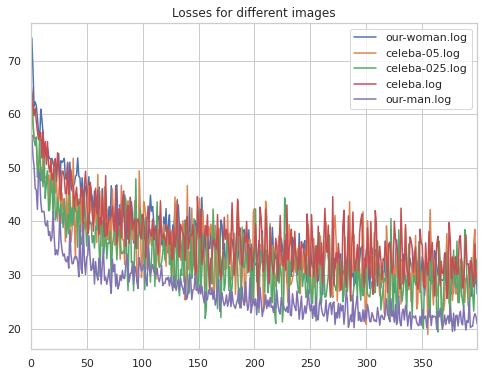

In [ ]:
losses.mean(axis=1, level=1).plot()
plt.title("Losses for different images");

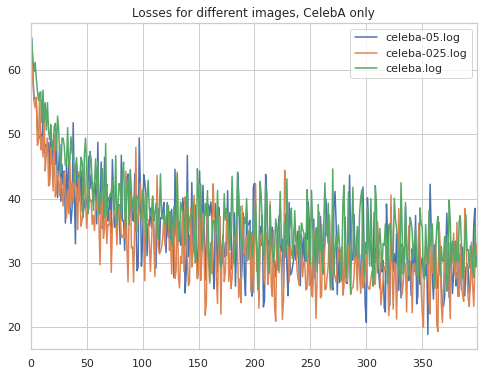

In [ ]:
(
    losses.mean(axis=1, level=1)
        .pipe(lambda frame: frame.loc[:, frame.columns.str.contains("celeba")])
        .plot()
)
plt.title("Losses for different images, CelebA only");

Loss curve seemingly does not differ between 32x32 and 128x128 CelebA.  Unfortunately it does not recognize the difference between the loss minimized because of face made more similar and the one minimized because the quality made worse...

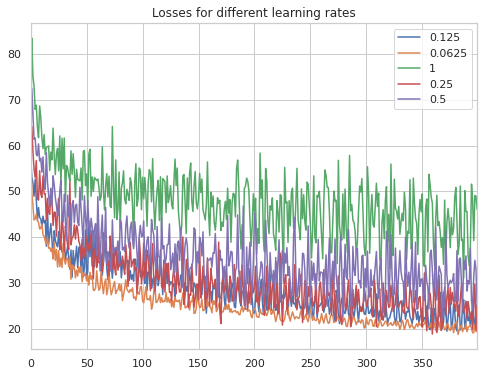

In [ ]:
losses.mean(axis=1, level=0).plot()
plt.title("Losses for different learning rates");

The lower the learning rate, the smoother the loss curve.  Not exactly surprising

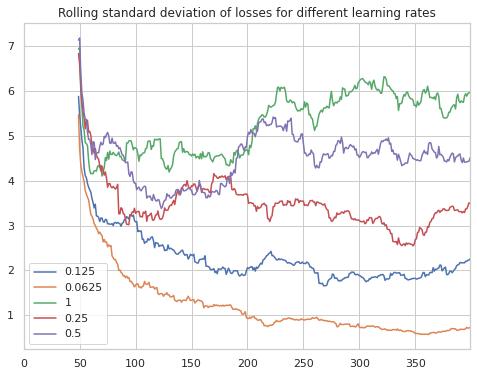

In [ ]:
(
    losses.mean(axis=1, level=0)
        .rolling(50)
        .std()
        .plot()
)
plt.title("Rolling standard deviation of losses for different learning rates");

## Relative blur

In [57]:
def _get_blur(filename):
    regex = re.compile("INFO - relative blur - (?P<number>[0-9.]+)")
    with open(filename) as file:
        return pd.Series([
            float(regex.match(line).group("number"))
            for line in file if "relative blur" in line
        ])
blur = _get_blur("../data/aligned/our-woman.log")

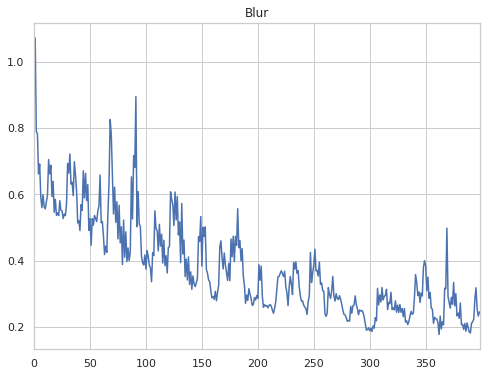

In [61]:
blur.plot()
plt.title("Blur");